<a href="https://colab.research.google.com/github/ai2070/Bear_detector/blob/main/Bear_detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

It'll discriminate three types of bear: grizzly, black and teddy bears

In [4]:
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [5]:
from fastbook import *
from fastai.vision.widgets import *

In [6]:
# Let's set API key form Bing
import os
key = os.environ.get('AZURE_SEARCH_KEY', 'e4f244ceb88840c1b511891cc0540c84')

In [7]:
search_images_bing

<function fastbook.search_images_bing>

In [8]:
# Let's download the URLs of 150 grizzly bears
results = search_images_bing(key, 'grizzly bear')
ims = results.attrgot('contentUrl')
len(ims)

150

In [30]:
# Let's look at one
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

In [9]:
ims

(#150) ['https://wallup.net/wp-content/uploads/2019/09/124575-grizzly-bear.jpg','https://wallpaperset.com/w/full/2/4/3/49392.jpg','https://ourplnt.com/wp-content/uploads/2020/12/grizzly-bear-1024x683.jpg?is-pending-load=1','https://1.bp.blogspot.com/-cFjM_xcu1EI/WubmipnINuI/AAAAAAAAC-Q/S-ox0CeLE70D_aHRzWRc1wGIP2gz1XrfQCLcBGAs/w1200-h630-p-k-no-nu/grizzly.jpg','https://get.wallhere.com/photo/wildlife-Zoo-Grizzly-bear-brown-bear-tree-animal-bear-fauna-mammal-lying-vertebrate-558907.jpg','https://4.bp.blogspot.com/-HNxOANqzIwQ/Un_rDbUxCGI/AAAAAAAABUc/CpX9FRsAdLA/s1600/Grizzly_Bear_2.jpg','https://wallpapertag.com/wallpaper/full/e/b/8/437151-grizzly-bear-backgrounds-2560x1600-for-tablet.jpg','https://tulsazoo.org/wp-content/uploads/2021/01/Grizzly-Thumbnail-1.jpg','https://www.naturephoto-cz.com/fullsize/others/grizzly-bear-215328.jpg','https://3.bp.blogspot.com/-er-humxrPfE/UmAexyQCukI/AAAAAAAAB6s/iLVsq3KUM0U/s1600/Grizzly-Bear-Picture-of-animals.jpg'...]

In [10]:
dest = 'images/grizzly.jpg'
download_url(ims[0], dest)

Path('images/grizzly.jpg')

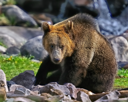

In [11]:
im = Image.open(dest)
im.to_thumb(128,128)

In [12]:
# Let's use fastai's download_images to download all the URLs for each of our serach terms and we'll put it in separate folders
bear_types = 'grizzly','black','teddy'
path = Path('bears')

In [13]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} bear')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [14]:
# Our folder has image files as we expect:
fns = get_image_files(path)
fns

(#428) [Path('bears/teddy/00000031.png'),Path('bears/teddy/00000134.jpg'),Path('bears/teddy/00000019.png'),Path('bears/teddy/00000038.jpg'),Path('bears/teddy/00000115.png'),Path('bears/teddy/00000121.jpeg'),Path('bears/teddy/00000036.jpg'),Path('bears/teddy/00000033.jpeg'),Path('bears/teddy/00000044.png'),Path('bears/teddy/00000085.jpg')...]

In [15]:
# We usually get corrupted files from the internet, let's check
failed = verify_images(fns)
failed

(#3) [Path('bears/teddy/00000090.jpg'),Path('bears/teddy/00000096.jpg'),Path('bears/black/00000102.png')]

In [16]:
#  To remove all the failed images, you can use unlink. Like most fastai functions that return a collection, verify_images returns an object of type L, which includes the map method. This calls the passed function on each element of the collection
failed.map(Path.unlink);

## From Data to DataLoaders

In [17]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock), # independet variable, dependent variable to predict
    get_items=get_image_files, # we tell fastai how to get the files
    splitter=RandomSplitter(valid_pct=0.2, seed=42), #split the set and gives random seed
    get_y=parent_label, # we name the independent variable as y
    item_tfms=Resize(128)) # resize all the images to the same size 128 pixel

In [18]:
dls = bears.dataloaders(path) #Let's create a DataLoaders

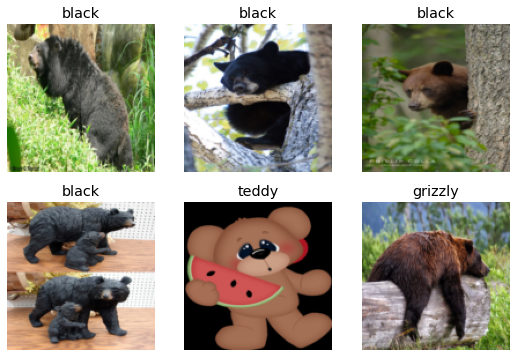

In [21]:
# Let's look inside the DataLoader
dls.valid.show_batch(max_n=6, nrows=2)

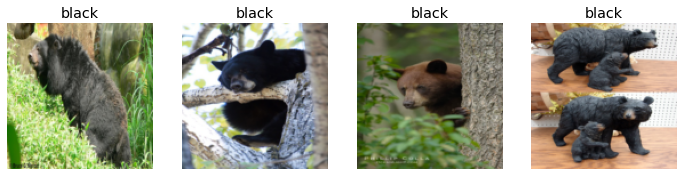

In [20]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

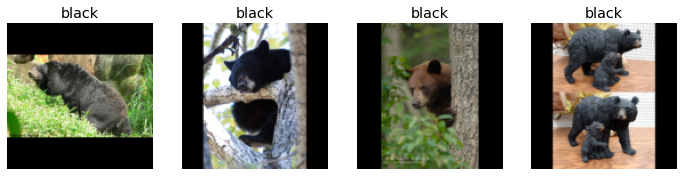

In [22]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

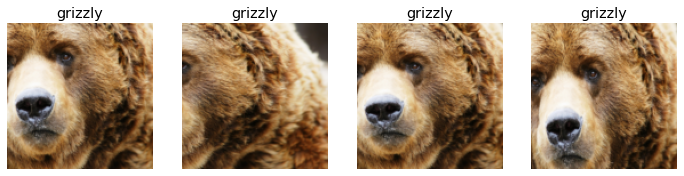

In [23]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

## Data augmentation
Let's create random variations of our input data such taht they appear different byut do not change the meaning of the data. Because our images are now all the same size, we can apply these augmentations to an entire batch of them using the GPU, which will save a lot of time. To tell fastai we want to use these transforms on a batch, we use the batch_tfms parameter (note that we’re not using RandomResizedCrop in this example, so you can see the differences more clearly; we’re also using double the amount of augmentation compared to the default, for the same reason):

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1051: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  ret = func(*args, **kwargs)


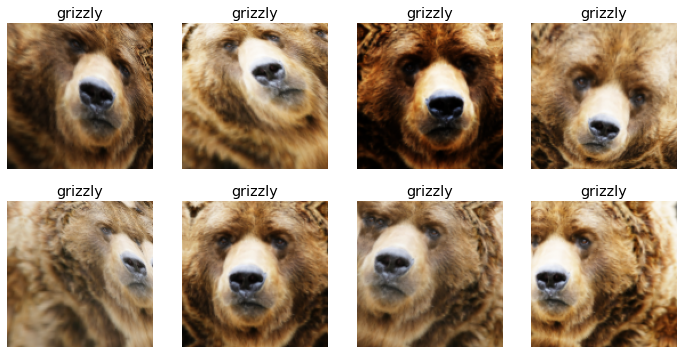

In [24]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training the model

In [25]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [27]:
 learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.804882,0.550388,0.200000,00:21


epoch,train_loss,valid_loss,error_rate,time
0,0.418075,0.344274,0.094118,00:22
1,0.306496,0.188295,0.058824,00:22
2,0.246488,0.213820,0.047059,00:22
3,0.205619,0.218282,0.047059,00:21


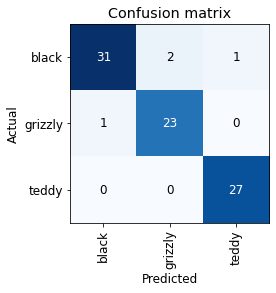

In [28]:
# Let's check any mistake with the confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

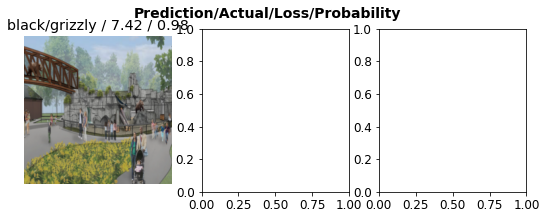

In [29]:
# Let's check the top  loss
interp.plot_top_losses(3, nrows=1)

In [30]:
# If we want to do some data label cleaning
cleaner = ImageClassifierCleaner(learn)
cleaner

In [46]:
# Delete all images selected for deletion and move images selected for different categories
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [47]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

## Turning Your Model into an Online Application

### Using model for inference

In [31]:
learn.export()

In [33]:
path = Path()
path.ls()

(#6) [Path('.config'),Path('gdrive'),Path('images'),Path('export.pkl'),Path('bears'),Path('sample_data')]

In [34]:
learn_inf = load_learner(path/'export.pkl')

In [35]:
learn_inf.predict('images/grizzly.jpg')

('grizzly', TensorBase(1), TensorBase([2.3908e-04, 9.9976e-01, 5.1426e-06]))

In [36]:
  learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

### Creating a Notebook App from the Model

In [41]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [42]:
img = PILImage.create(btn_upload.data[-1])

In [43]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [44]:
pred,pred_idx,probs = learn_inf.predict(img)

In [45]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: teddy; Probability: 1.0000')

In [46]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [47]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [48]:
 VBox([widgets.Label('Select your bear!'),
      btn_upload, btn_run, out_pl, lbl_pred])

## Deploy your app

In [1]:
!pip install voila
!jupyter serverextension enable voila --sys-prefix

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?
